# Libraries and Utilities loading

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import cv2
import random
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPool2D
from tensorflow.keras.utils import normalize
from tensorflow.keras.callbacks import TensorBoard
from keras.preprocessing import image
import pickle
!pip install sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score

In [ ]:
!mkdir carpeta_salida

mkdir: cannot create directory ‘carpeta_salida’: File exists


In [ ]:
!pip install tensorflowjs

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Global Variables

In [ ]:
IMG_SIZE = 500
n_epochs = 200
# Ruta datos entrada
DATADIR = "/content/drive/MyDrive/Gatingos"

# Categorias
CATEGORIES = ["Ronnies", "Chuchis"]

# Ruta datos salida
OUTPATH = "/content/drive/MyDrive/Gatingos/Salida"

# Ruta datos completamente nuevos para predecir
PREDPATH = "/content/drive/MyDrive/Gatingos/Pruebas"

# Dataset Preparation

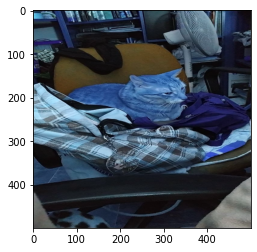

0


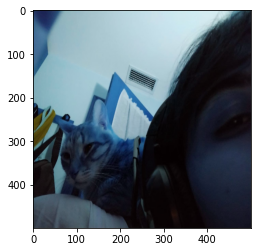

0


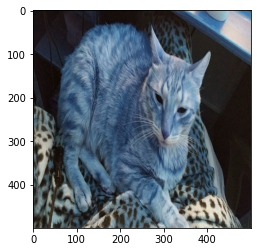

0


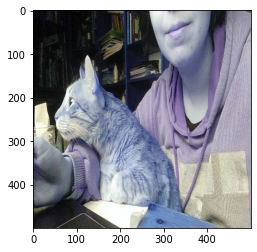

0


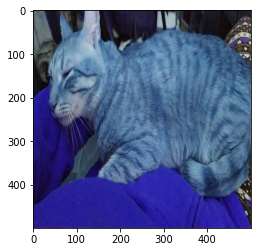

0


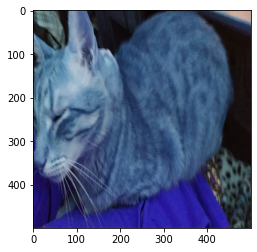

0


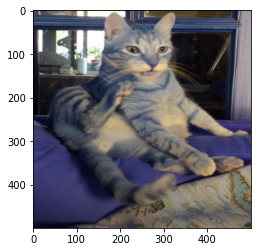

0


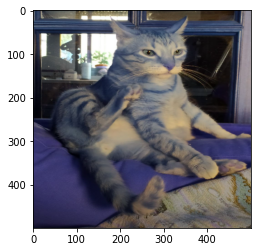

0


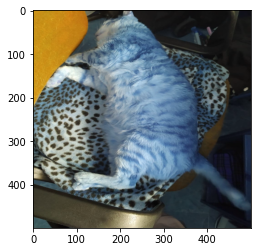

0


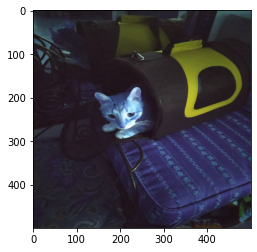

0


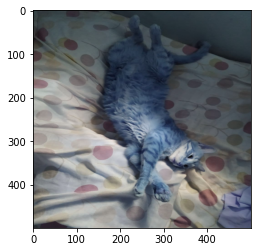

0


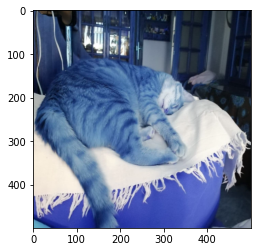

0


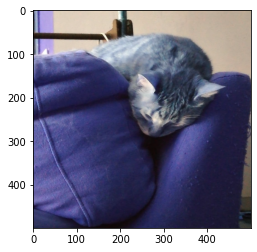

0


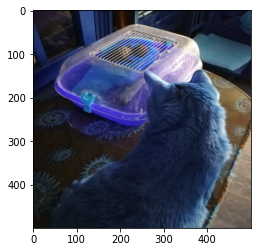

0


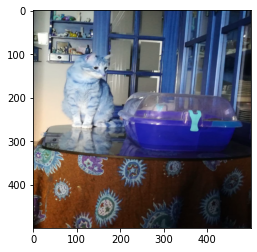

0


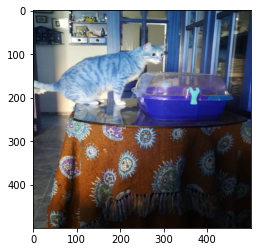

0


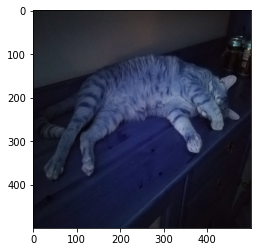

0


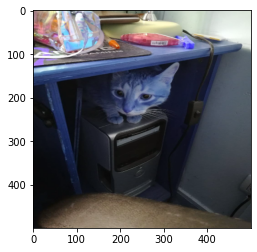

0


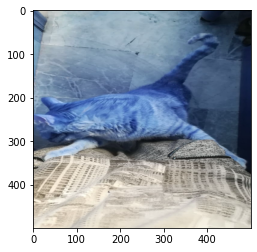

0


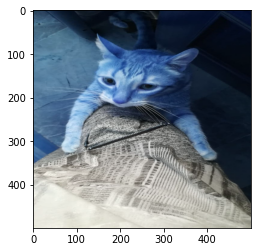

0


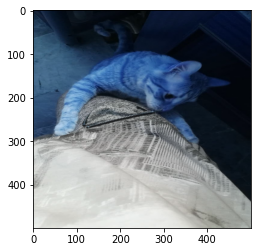

0


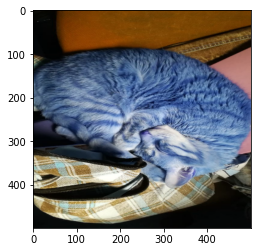

0


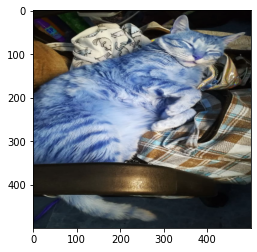

0


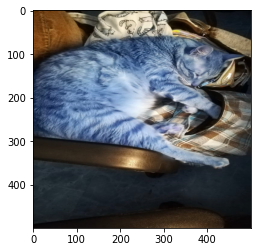

0


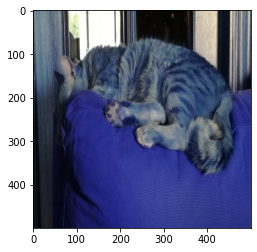

0


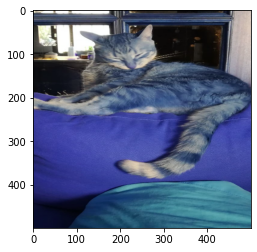

0


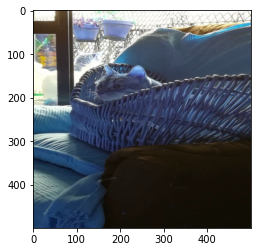

0


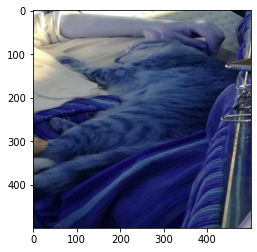

0


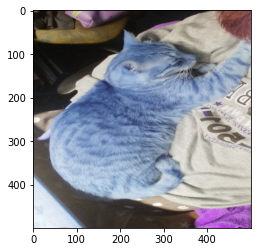

0


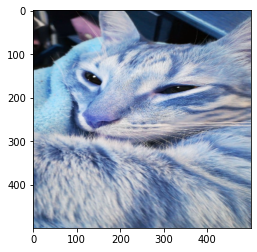

0


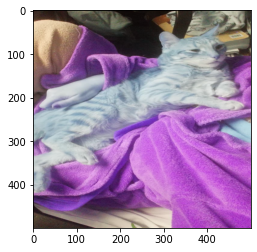

0


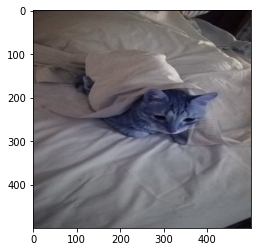

0


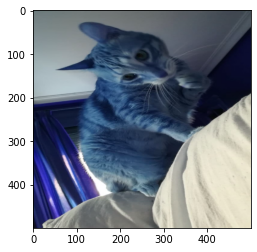

0


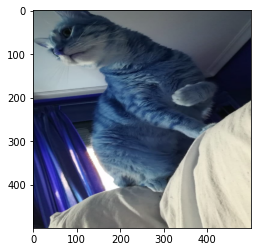

0


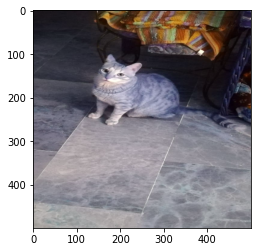

0


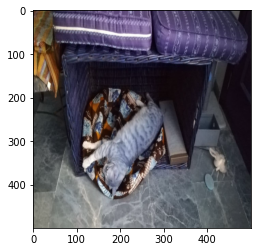

0


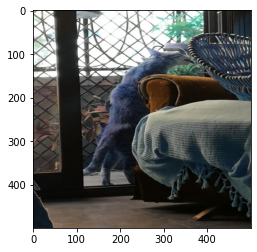

0


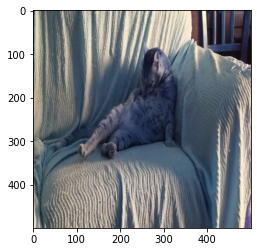

0


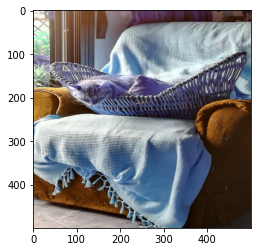

0


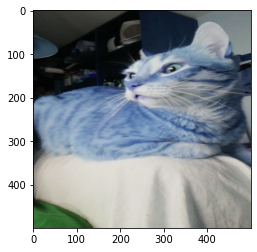

0


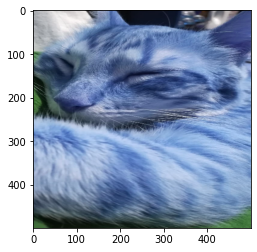

0


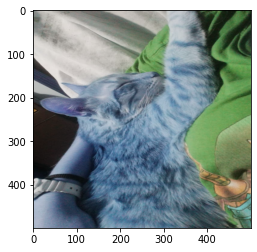

0


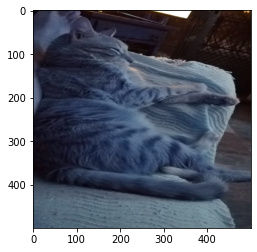

0


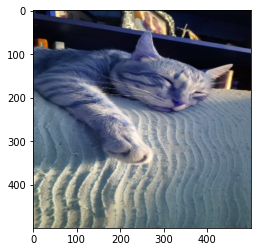

0


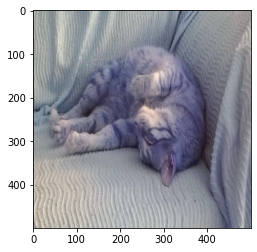

0


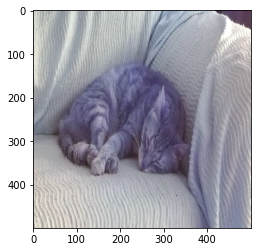

0


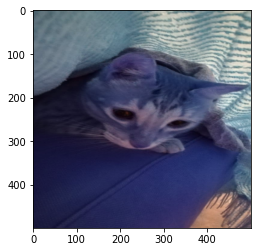

0


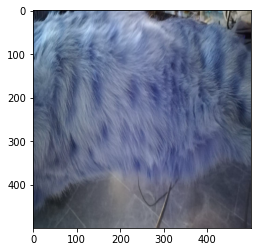

0


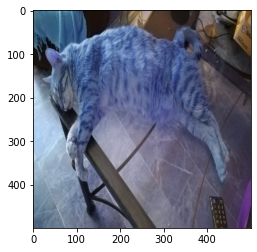

0


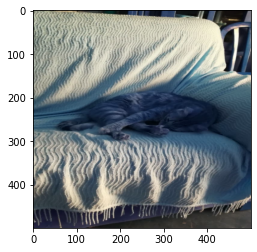

0


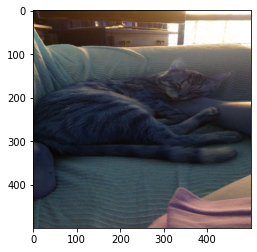

0


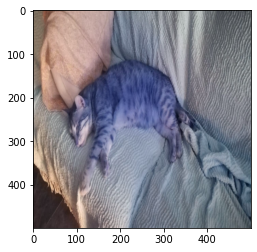

0


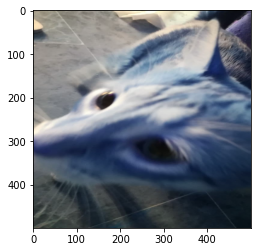

0


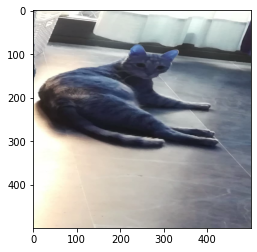

0


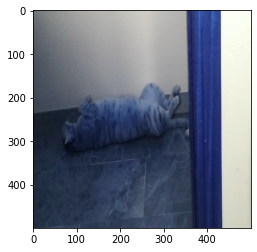

0


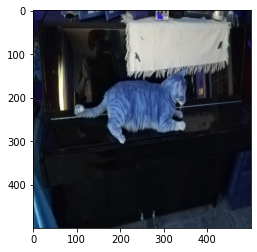

0


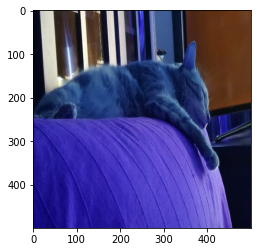

0


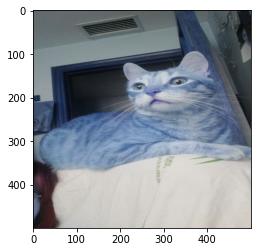

0


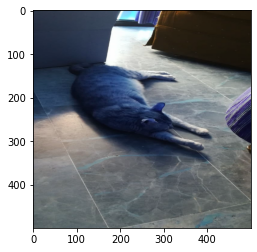

0


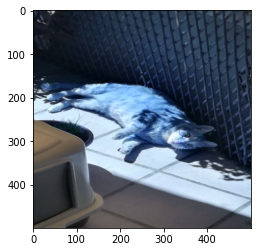

0


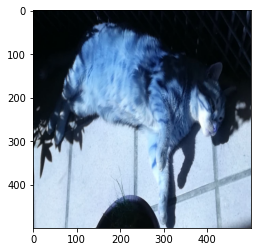

0


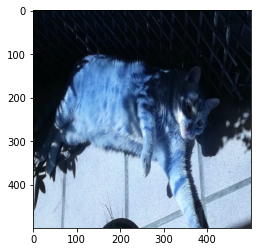

0


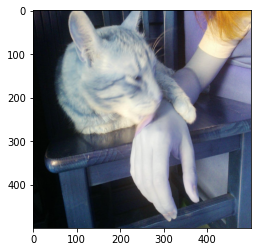

0


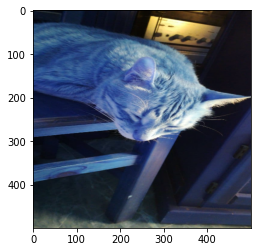

0


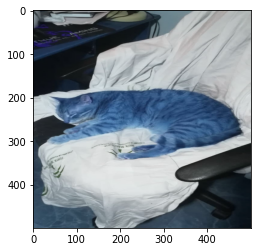

0


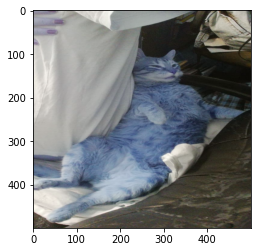

0


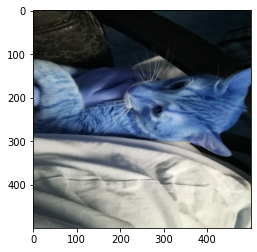

0


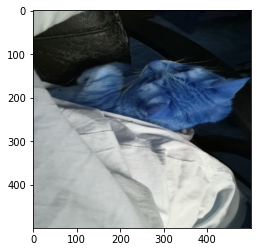

0


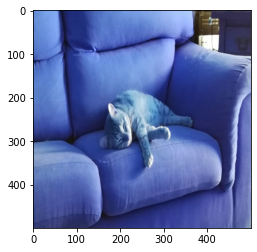

0


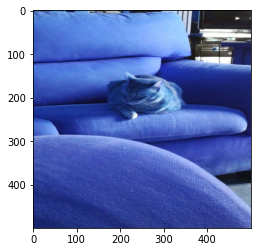

0


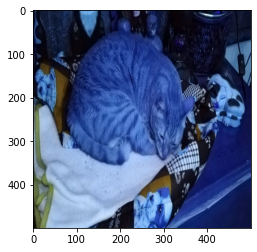

0


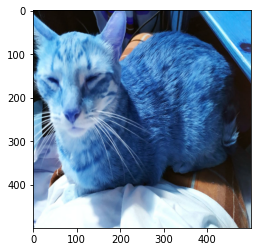

0


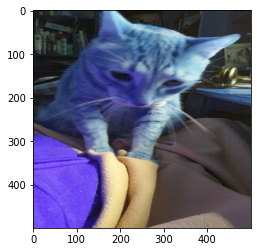

0


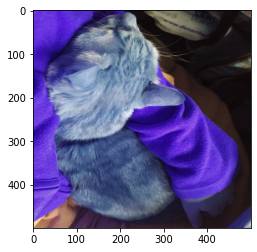

0


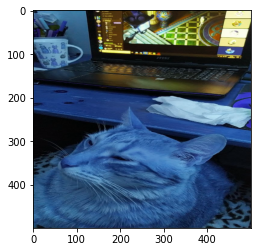

0


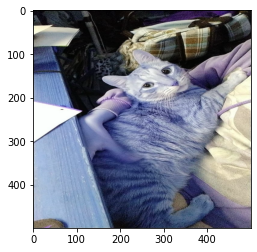

0


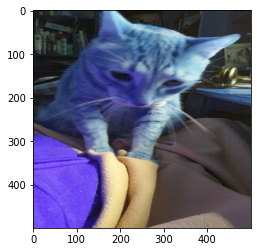

0


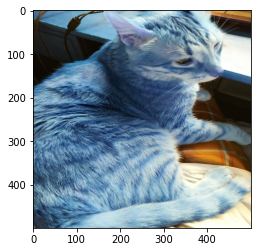

0


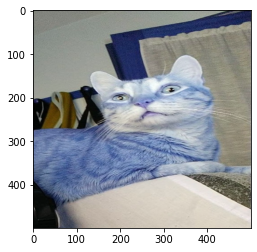

0


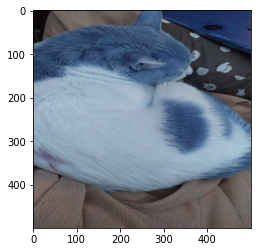

1


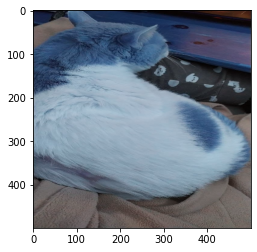

1


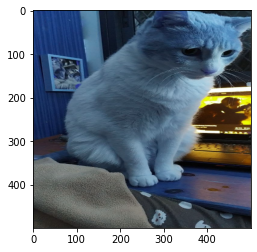

1


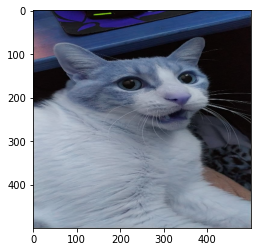

1


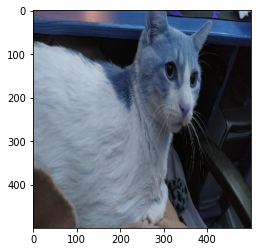

1


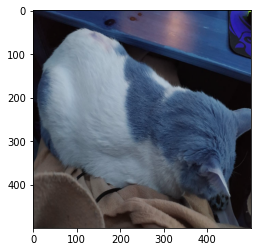

1


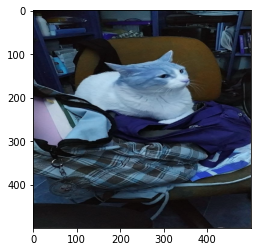

1


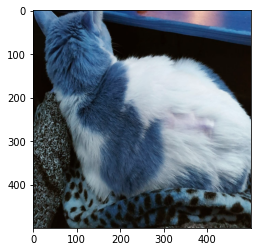

1


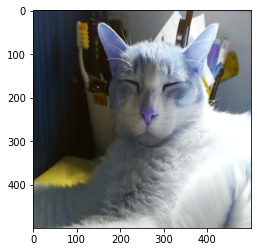

1


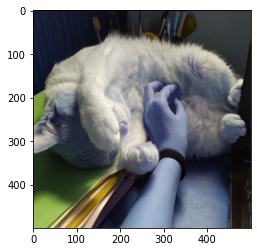

1


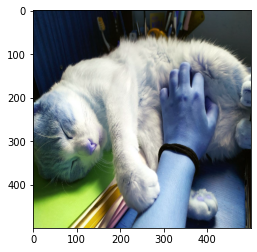

1


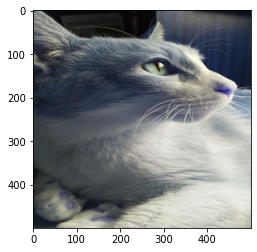

1


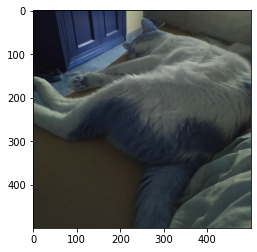

1


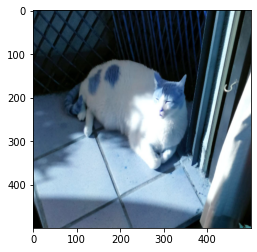

1


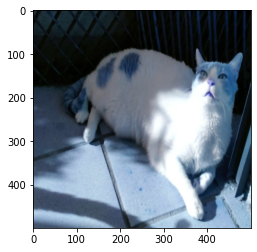

1


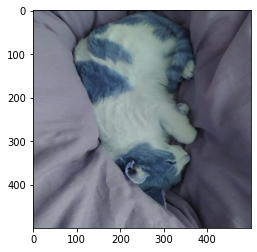

1


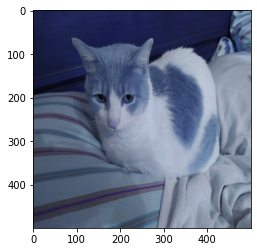

1


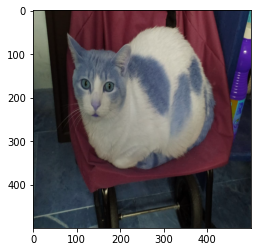

1


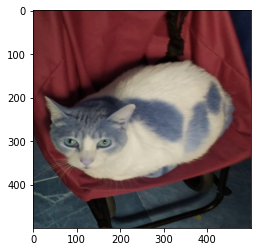

1


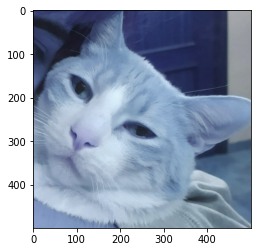

1


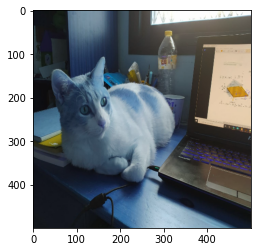

1


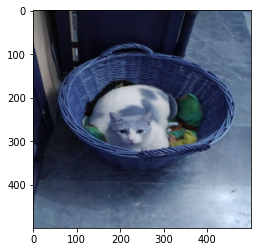

1


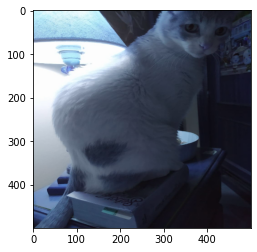

1


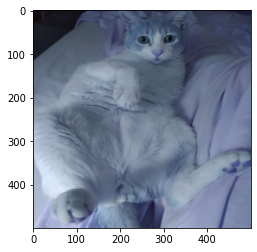

1


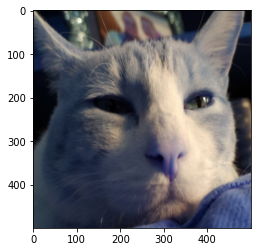

1


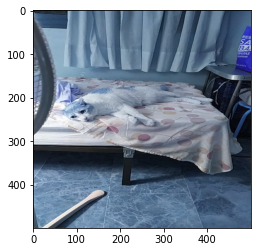

1


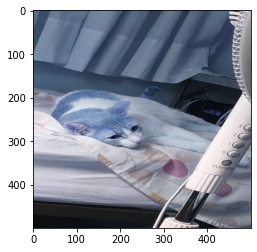

1


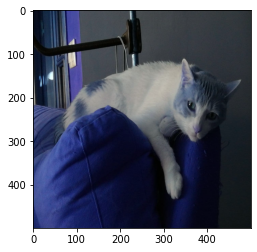

1


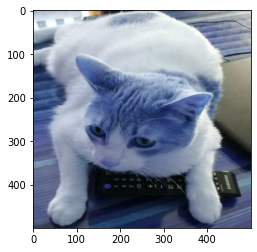

1


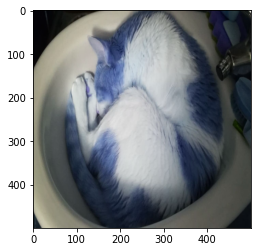

1


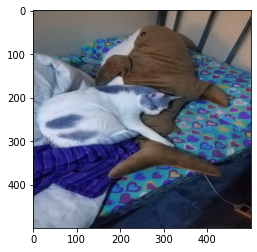

1


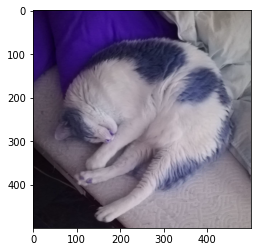

1


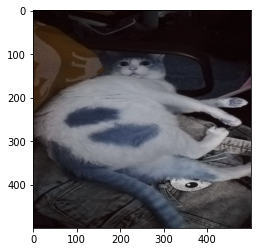

1


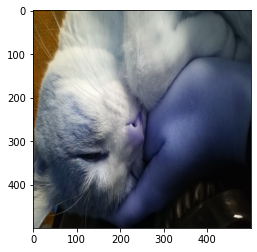

1


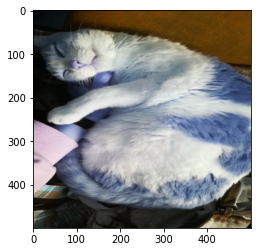

1


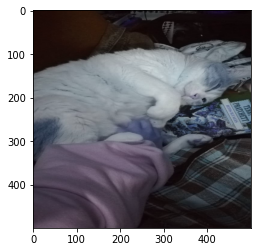

1


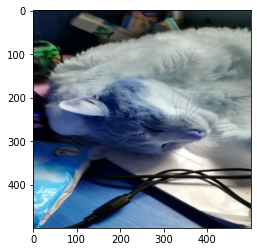

1


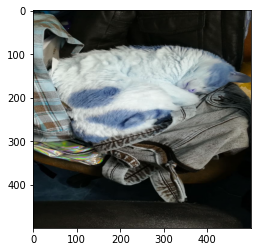

1


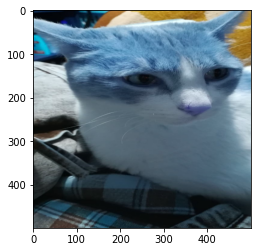

1


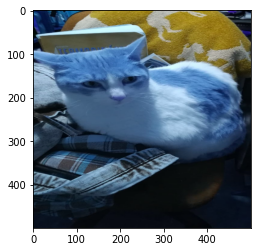

1


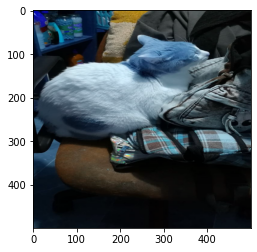

1


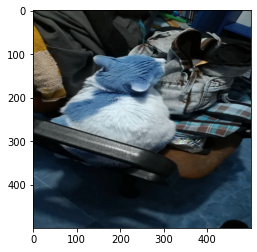

1


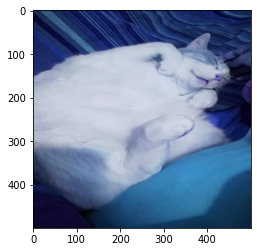

1


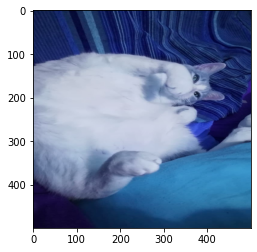

1


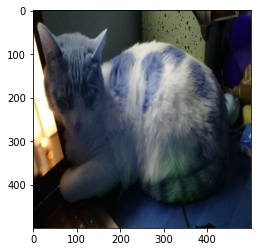

1


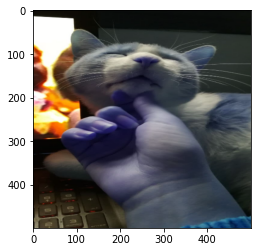

1


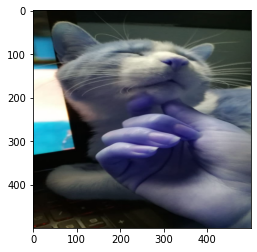

1


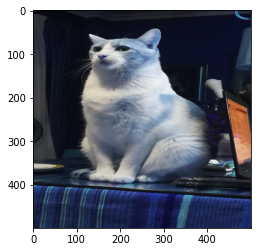

1


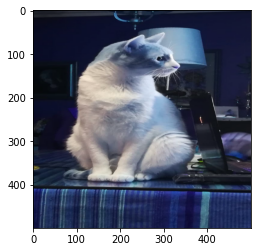

1


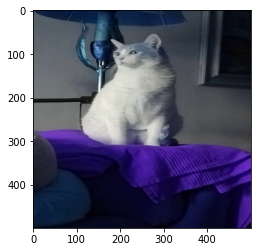

1


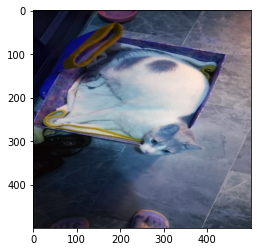

1


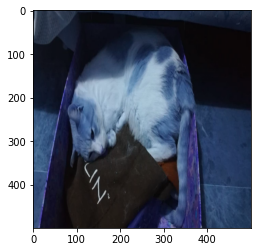

1


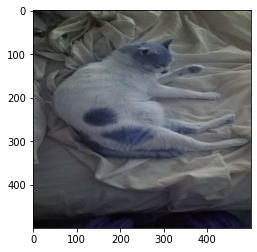

1


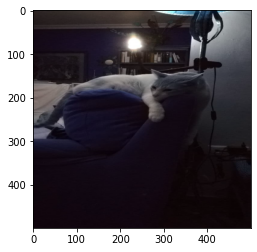

1


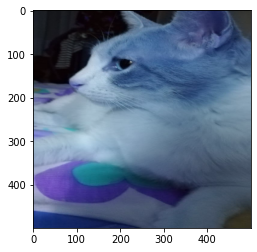

1


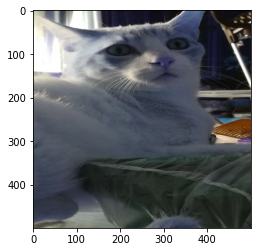

1


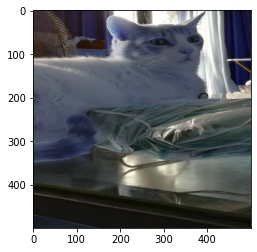

1


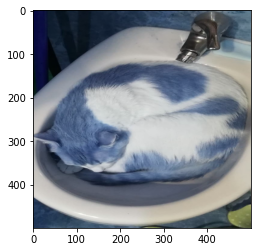

1


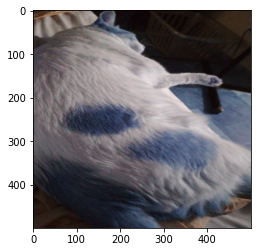

1


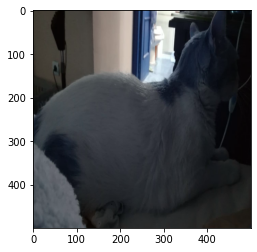

1


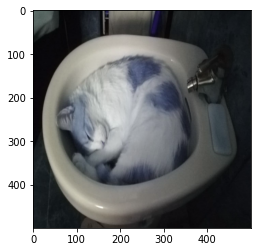

1


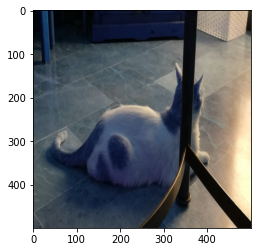

1


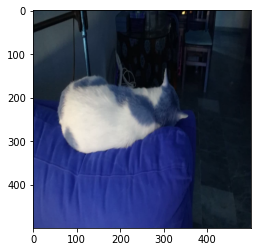

1


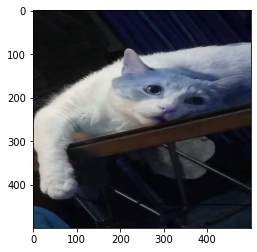

1


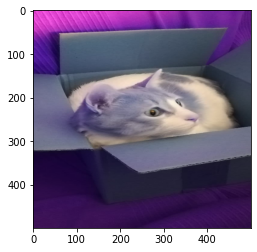

1


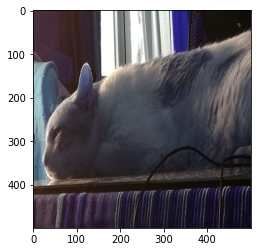

1


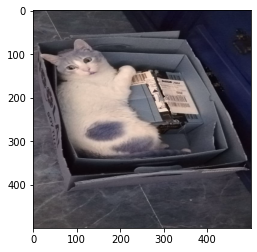

1


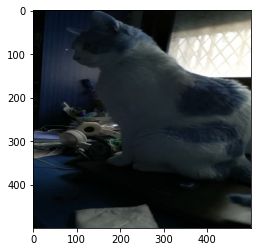

1


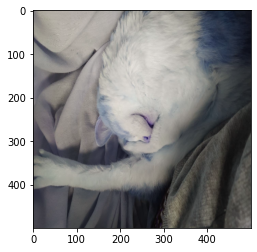

1


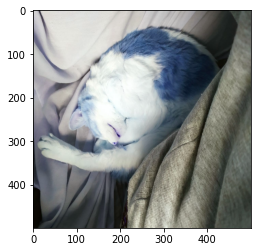

1


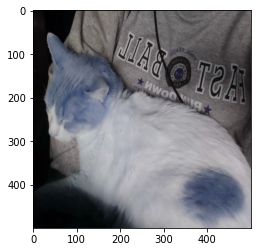

1


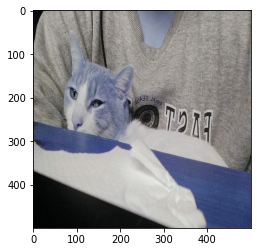

1


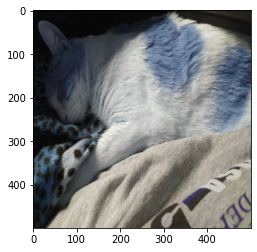

1


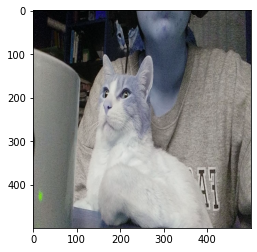

1


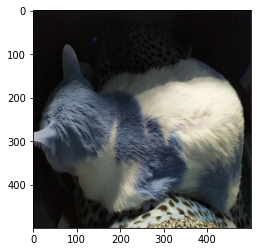

1


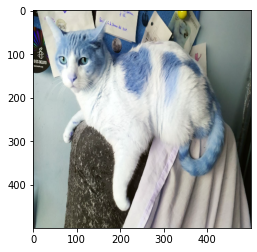

1


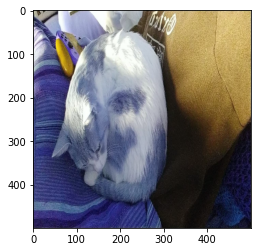

1


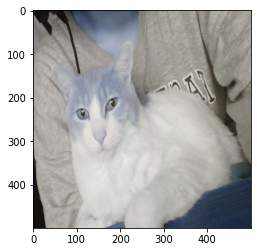

1


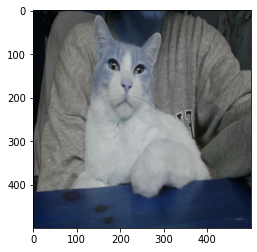

1
158
<class 'list'>
X_data shape: (158, 2)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [ ]:
train_data = []

def create_training_data():
  for category in CATEGORIES:
    path = os.path.join(DATADIR, category) # creates a path to Chuchis and Ronnies
    class_num = CATEGORIES.index(category)
    for img in os.listdir(path):
      try:
        img = cv2.imread(os.path.join(path, img))
        #data_size = img[i].shape
        #img_final = cropImage(img, data_size)
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), 3)
        img = img.reshape(IMG_SIZE, IMG_SIZE, 3)
        plt.imshow(img)
        plt.show()
        print(class_num)
        train_data.append([img, class_num])
      except Exception as e:
        pass
create_training_data()
print(len(train_data))
print(type(train_data))
print('X_data shape:', np.array(train_data).shape)

In [ ]:
train_data[0]

[array([[[ 77,  97, 102],
         [ 59,  78,  83],
         [ 67,  85,  92],
         ...,
         [ 18,  13,  15],
         [ 18,  13,  15],
         [ 18,  13,  15]],
 
        [[ 84, 105, 110],
         [ 42,  62,  69],
         [ 54,  74,  82],
         ...,
         [ 17,  12,  14],
         [ 17,  12,  14],
         [ 17,  12,  14]],
 
        [[141, 164, 172],
         [ 69,  91, 101],
         [ 40,  62,  74],
         ...,
         [ 16,  11,  13],
         [ 16,  11,  13],
         [ 16,  11,  13]],
 
        ...,
 
        [[ 81,  81,  81],
         [ 88,  88,  88],
         [ 86,  86,  86],
         ...,
         [120, 118, 114],
         [117, 114, 111],
         [119, 115, 114]],
 
        [[ 85,  85,  85],
         [ 84,  84,  84],
         [ 81,  81,  81],
         ...,
         [126, 124, 123],
         [122, 120, 119],
         [122, 120, 119]],
 
        [[ 84,  84,  84],
         [ 83,  83,  83],
         [ 83,  83,  83],
         ...,
         [134, 131, 131],
  

In [ ]:
random.shuffle(train_data)

In [ ]:
X = [] #imagenes de entrada (pixeles)
y = [] #etiquetas (perro o gato)

for imagen, etiqueta in train_data:
  X.append(imagen)
  y.append(etiqueta)

In [ ]:
#Normalizar los datos de las X (imagenes). Se pasan a numero flotante y dividen entre 255 para quedar de 0-1 en lugar de 0-255
'''
def normalizacion(X):
  if (np.array(X)[0][0][0][0]>1):
    X = np.array(X).astype(float) / 255
    print("hola")
normalizacion(X)
'''
X = np.array(X).astype(float) / 255
#plt.imshow(X[5])
#print(X)
#Convertir etiquetas en arreglo simple
y = np.array(y)
#1.56616166e-18
y.shape

(158,)

In [ ]:
np.array(X)

array([[[[0.36862745, 0.18039216, 0.85490196],
         [0.36862745, 0.18039216, 0.85490196],
         [0.39215686, 0.19607843, 0.8745098 ],
         ...,
         [0.41568627, 0.3254902 , 0.2627451 ],
         [0.39607843, 0.30980392, 0.24705882],
         [0.38039216, 0.29411765, 0.22745098]],

        [[0.37647059, 0.18823529, 0.8627451 ],
         [0.38039216, 0.18431373, 0.85882353],
         [0.4       , 0.20392157, 0.87843137],
         ...,
         [0.41568627, 0.32941176, 0.2627451 ],
         [0.43137255, 0.34117647, 0.27843137],
         [0.40784314, 0.31764706, 0.25490196]],

        [[0.38823529, 0.19607843, 0.8627451 ],
         [0.39215686, 0.19215686, 0.8627451 ],
         [0.41176471, 0.20784314, 0.87843137],
         ...,
         [0.38431373, 0.29019608, 0.23137255],
         [0.38039216, 0.29019608, 0.22745098],
         [0.45490196, 0.36470588, 0.30196078]],

        ...,

        [[0.96862745, 0.85098039, 0.62745098],
         [0.97647059, 0.83137255, 0.61568627]

# Get from the dataset a training dataset and test dataset

In [ ]:
#Separar los datos de entrenamiento y los datos de pruebas en variables diferentes

div_train = len(X) * .85 
div_test = len(X) - int(div_train) 
print(div_test)
X_entrenamiento = X[:int(div_train)]
X_validacion = X[int(div_train):]

y_entrenamiento = y[:int(div_train)]
y_validacion = y[int(div_train):]

X_validacion


24


array([[[[0.06666667, 0.07843137, 0.10980392],
         [0.06666667, 0.07843137, 0.10980392],
         [0.06666667, 0.07843137, 0.10980392],
         ...,
         [0.99607843, 0.99607843, 0.99215686],
         [0.99607843, 0.99607843, 0.99215686],
         [0.96078431, 0.96470588, 0.96078431]],

        [[0.06666667, 0.07843137, 0.10980392],
         [0.06666667, 0.07843137, 0.10980392],
         [0.06666667, 0.07843137, 0.10980392],
         ...,
         [0.98823529, 0.99215686, 0.98431373],
         [0.99215686, 0.99215686, 0.98431373],
         [0.96470588, 0.96470588, 0.95686275]],

        [[0.06666667, 0.07843137, 0.10980392],
         [0.06666667, 0.07843137, 0.10980392],
         [0.06666667, 0.07843137, 0.10980392],
         ...,
         [0.99607843, 1.        , 0.99215686],
         [1.        , 1.        , 0.99607843],
         [0.98039216, 0.98431373, 0.97647059]],

        ...,

        [[0.08235294, 0.09803922, 0.11764706],
         [0.08235294, 0.09803922, 0.11764706]

# ImageDataGenerator Model

Longitud inicial X: 158
Longitud final X: 158


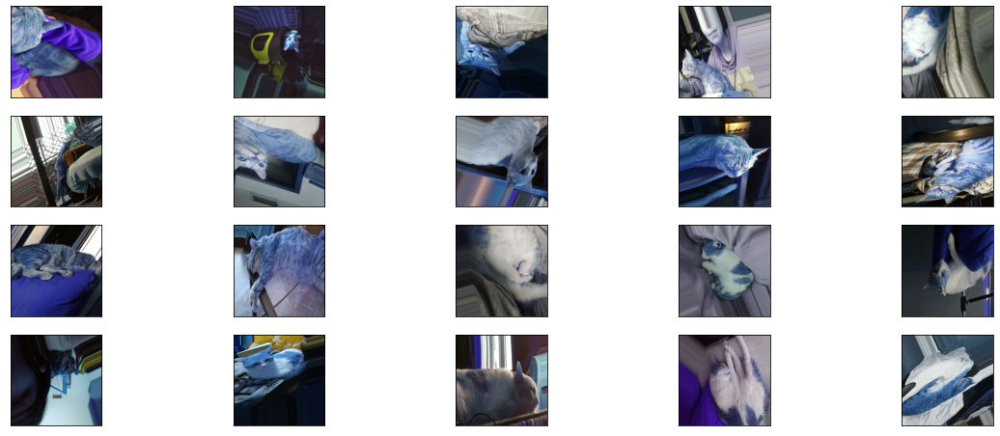

In [ ]:
#Realizar el aumento de datos con varias transformaciones. Al final, graficar 10 como ejemplo
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)
print("Longitud inicial X:", len(X))
datagen.fit(X)
print("Longitud final X:", len(X))
plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(X, y, batch_size=20, shuffle=False):
  for i in range(20):
    plt.subplot(4, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(500, 500, 3))
  break

In [ ]:
modeloCNN2_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(500, 500, 3)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(256, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(125, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
modeloCNN2_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [ ]:
data_gen_entrenamiento = datagen.flow(X_entrenamiento, y_entrenamiento, batch_size=32)

In [ ]:
tensorboardCNN2_AD = TensorBoard(log_dir='logs/cnn2_AD')

modeloCNN2_AD.fit(
    data_gen_entrenamiento,
    epochs=n_epochs, batch_size=8,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN2_AD]
)

Epoch 1/200
5/5 [==============================] - 68s 10s/step - loss: 0.7201 - accuracy: 0.4701 - val_loss: 0.7028 - val_accuracy: 0.2500
Epoch 2/200
5/5 [==============================] - 58s 11s/step - loss: 0.6919 - accuracy: 0.5075 - val_loss: 0.7024 - val_accuracy: 0.2500
Epoch 3/200
5/5 [==============================] - 53s 10s/step - loss: 0.6905 - accuracy: 0.5075 - val_loss: 0.7117 - val_accuracy: 0.2500
Epoch 4/200
5/5 [==============================] - 54s 10s/step - loss: 0.6787 - accuracy: 0.5075 - val_loss: 0.7828 - val_accuracy: 0.2500
Epoch 5/200
5/5 [==============================] - 55s 10s/step - loss: 0.6674 - accuracy: 0.5149 - val_loss: 0.7096 - val_accuracy: 0.2500
Epoch 6/200
5/5 [==============================] - 56s 11s/step - loss: 0.6470 - accuracy: 0.5970 - val_loss: 0.6053 - val_accuracy: 0.6250
Epoch 7/200
5/5 [==============================] - 54s 10s/step - loss: 0.6373 - accuracy: 0.6866 - val_loss: 0.5632 - val_accuracy: 0.8750
Epoch 8/200
5/5 [===

# TensorBoard

In [ ]:
#Cargar la extension de tensorboard de colab
%load_ext tensorboard

In [ ]:
#Ejecutar tensorboard e indicarle que lea la carpeta "logs"
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# Saving Trained Model

In [ ]:
modeloCNN2_AD.save('chuchis-ronnies-cnn2-'+str(n_epochs)+'epochs_2.0.h5')

In [ ]:
!tensorflowjs_converter --input_format keras chuchis-ronnies-cnn2-ad.h5 carpeta_salida

Traceback (most recent call last):
  File "/usr/local/bin/tensorflowjs_converter", line 8, in <module>
    sys.exit(pip_main())
  File "/usr/local/lib/python3.7/dist-packages/tensorflowjs/converters/converter.py", line 813, in pip_main
    main([' '.join(sys.argv[1:])])
  File "/usr/local/lib/python3.7/dist-packages/tensorflowjs/converters/converter.py", line 817, in main
    convert(argv[0].split(' '))
  File "/usr/local/lib/python3.7/dist-packages/tensorflowjs/converters/converter.py", line 804, in convert
    weight_shard_size_bytes, metadata_map)
  File "/usr/local/lib/python3.7/dist-packages/tensorflowjs/converters/converter.py", line 501, in _dispatch_converter
    metadata=metadata_map)
  File "/usr/local/lib/python3.7/dist-packages/tensorflowjs/converters/converter.py", line 76, in dispatch_keras_h5_to_tfjs_layers_model_conversion
    raise ValueError('Nonexistent path to HDF5 file: %s' % h5_path)
ValueError: Nonexistent path to HDF5 file: chuchis-ronnies-cnn2-ad.h5


# Loading the Stored Model and Architecture of the Trained Model

In [ ]:
new_model = tf.keras.models.load_model('/content/chuchis-ronnies-cnn2-'+str(n_epochs)+'epochs.h5')

# Check its architecture
new_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 498, 498, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 249, 249, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 247, 247, 32)      9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 123, 123, 32)     0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 121, 121, 64)      18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 60, 60, 64)       0

In [ ]:
print('X_validacion shape:', np.array(X_validacion).shape)

X_validacion shape: (24, 500, 500, 3)


In [ ]:
print('X_validacion shape:', np.array(y_validacion).shape)

X_validacion shape: (24,)


# ***Predict New Images***

In [ ]:
from keras.preprocessing import image
def load_image(img_path, show=False):

    img = image.load_img(img_path, target_size=(500, 500))
    img_tensor = image.img_to_array(img)                    # (height, width, channels)
    img_tensor = np.expand_dims(img_tensor, axis=0)         # (1, height, width, channels), add a dimension because the model expects this shape: (batch_size, height, width, channels)
    img_tensor /= 255.                                      # imshow expects values in the range [0, 1]

    if show:
        plt.imshow(img_tensor[0])                           
        plt.axis('off')
        plt.show()

    return img_tensor

In [ ]:
def category(predict):
  if (predict < 0.5):
    return "Ronnie"
  else:
   return "Chuchi"

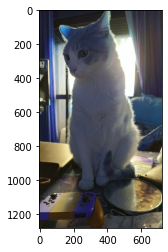

Nivel de Pura Ira Chuchil: [83.8497] %
Este gato es un: Chuchi


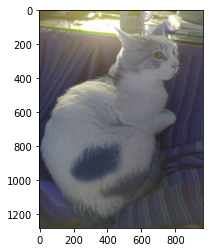

Nivel de Pura Ira Chuchil: [91.50462] %
Este gato es un: Chuchi


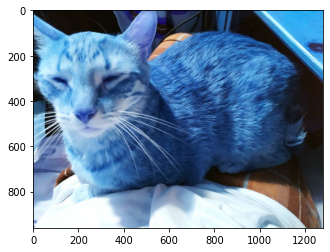

Nivel de Pura Ira Chuchil: [33.3779] %
Este gato es un: Ronnie


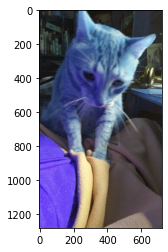

Nivel de Pura Ira Chuchil: [13.344556] %
Este gato es un: Ronnie


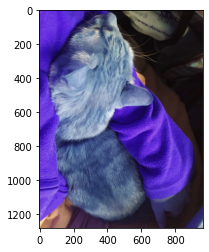

Nivel de Pura Ira Chuchil: [0.39575696] %
Este gato es un: Ronnie


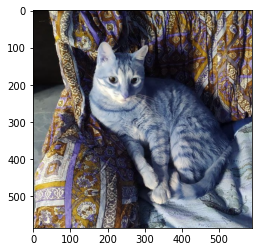

Nivel de Pura Ira Chuchil: [3.5290837] %
Este gato es un: Ronnie


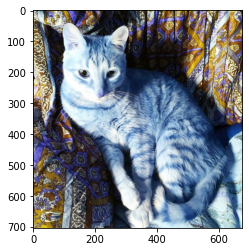

Nivel de Pura Ira Chuchil: [21.310297] %
Este gato es un: Ronnie


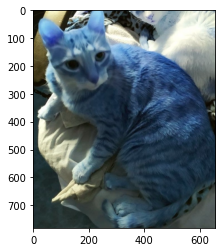

Nivel de Pura Ira Chuchil: [25.092142] %
Este gato es un: Ronnie


In [ ]:
for sample in os.listdir(PREDPATH):

  # Preparacion imagenes para prediccion
  img_path = os.path.join(PREDPATH, sample)
  img = load_image(img_path)

  # Realizamos la prediccion
  predict = new_model.predict(img)
  img_show = cv2.imread(img_path)
  plt.imshow(img_show)
  plt.show()
  print("Nivel de Pura Ira Chuchil:", predict[0]*100, "%")
  print("Este gato es un:", category(predict[0]))
